In [57]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn import linear_model
import glob
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from validation import validate
import xgboost as xgb
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly
import plotly.graph_objs as go
init_notebook_mode(connected=True)
from sklearn.ensemble import RandomForestRegressor
from keras.models import Sequential
from keras.wrappers.scikit_learn import KerasRegressor
from keras.layers import Dense, Dropout, Activation
from keras.layers.recurrent import LSTM
from keras.optimizers import SGD, Adam
from keras.callbacks import Callback
from scipy import stats
import statsmodels.api as sm
from itertools import product
from tqdm import tqdm
import seaborn as sns

In [2]:
all_files = glob.glob("./grouped_by_time/*.csv")
trip_counts = [pd.read_csv(f, header=None)[1].sum() for f in all_files]

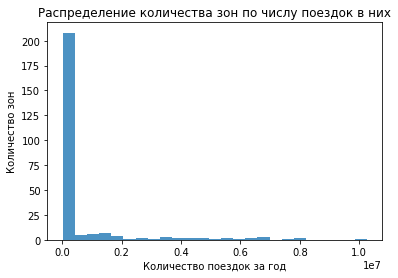

In [3]:
plt.hist(trip_counts, 25, alpha = 0.8)
plt.xlabel("Количество поездок за год")
plt.ylabel("Количество зон")
plt.title("Распределение количества зон по числу поездок в них")

In [4]:
def load_zone(file_name):
    df = pd.read_csv(file_name, header=None)
    res = pd.DataFrame()
    res['y'] = df[1]
    res.index = df[0]
    return res.y

In [5]:
files = pd.DataFrame()
files['name'] = all_files
files['count'] = trip_counts
files = files.sort_values(by='count')
files.index = np.arange(1, len(files) + 1)
dates = load_zone(files.name.values[0]).index
train_files = files[files.index % 5 != 0]
test_files = files[files.index % 5 == 0]
train_files = pd.concat([train_files[1:3], train_files[-3:], train_files[50:60]])
test_files = pd.concat([test_files[-5:-4]])

In [6]:
def create_features(data, lags_count):
    df = []
    for i in range(lags_count, len(data)):
        part = data[i-lags_count:i]
        scaler = StandardScaler()
        scaled = scaler.fit_transform(part.values)
        label = scaler.transform([data.values[i]])
        scaled = np.concatenate([scaled, label, [scaler.std_, scaler.mean_]])
        df.append(scaled)
    df = pd.DataFrame(df)
    df.columns = ["t_%s" % i for i in range(lags_count)] + ["label", "std", "mean"]
    return df

In [7]:
lags_count = 168 * 2
train = pd.concat([create_features(load_zone(f), lags_count) for f in train_files.name.values])
test = pd.concat([create_features(load_zone(f), lags_count) for f in test_files.name.values])

In [8]:
def test_model(model):
    model.fit(train[["t_%s" % i for i in range(lags_count)]], train.label)
    pred = model.predict(test[["t_%s" % i for i in range(lags_count)]])
    real = test.label.values
    validate(real, pred, name=str(model), max_lags=lags_count)
    pred = pred * test['std'] + test['mean']
    pred = list(map(lambda x: 0 if x < 0 else x, pred))
    real = real * test['std'] + test['mean']
    init_notebook_mode(connected=True)

    trace1 = go.Scatter(
        x=dates,
        y=real.values,
    name = "real")
    trace2 = go.Scatter(
        x=dates,
        y=pred,
    name="pred")

    d = [trace1, trace2]

    fig = go.Figure(data=d)
    iplot(fig, show_link=False)

----------------------------------
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False) validation summary
-----------------------------------
RMSE = 0.2826171351752832
residuals sum = -118.87274216134075


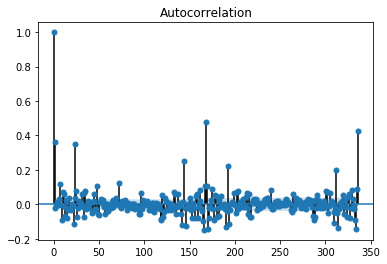

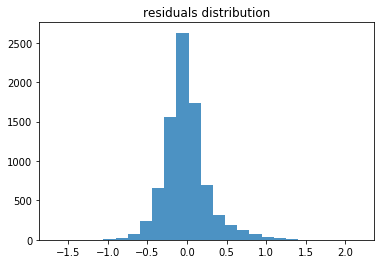

CPU times: user 5.94 s, sys: 543 ms, total: 6.49 s
Wall time: 3.71 s


In [9]:
%%time
test_model(linear_model.LinearRegression())

----------------------------------
XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=1, gamma=0,
       learning_rate=0.1, max_delta_step=0, max_depth=4,
       min_child_weight=1, missing=None, n_estimators=100, nthread=-1,
       objective='reg:linear', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=42, silent=True, subsample=1) validation summary
-----------------------------------
RMSE = 0.29347970463607553
residuals sum = 51.38092314707769


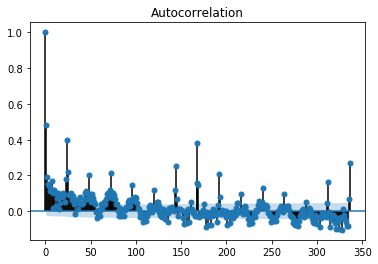

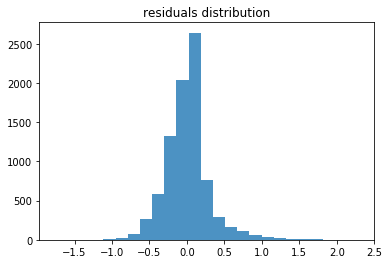

CPU times: user 13min 55s, sys: 9.46 s, total: 14min 4s
Wall time: 2min 28s


In [10]:
%%time
test_model(xgb.XGBRegressor(seed=42, max_depth=4, n_estimators=100))

----------------------------------
BayesianRidge(alpha_1=10, alpha_2=1e-06, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=1e-06, lambda_2=1e-06, n_iter=300,
       normalize=False, tol=0.001, verbose=False) validation summary
-----------------------------------
RMSE = 0.2848320325457736
residuals sum = -119.07934596569795


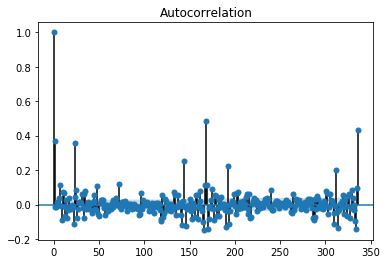

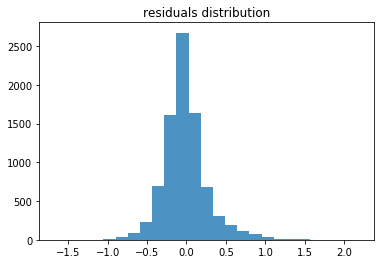

CPU times: user 24.7 s, sys: 1.71 s, total: 26.5 s
Wall time: 13.9 s


In [11]:
%%time
test_model(linear_model.BayesianRidge(alpha_1=10))

----------------------------------
Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001) validation summary
-----------------------------------
RMSE = 0.28297349386544157
residuals sum = -117.691033556356


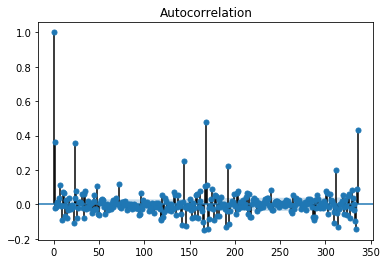

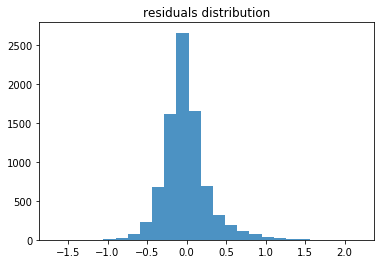

CPU times: user 5.6 s, sys: 1.42 s, total: 7.02 s
Wall time: 5.91 s


In [12]:
%%time
test_model(linear_model.Ridge())

----------------------------------
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=10, n_jobs=1, oob_score=False, random_state=42,
           verbose=0, warm_start=False) validation summary
-----------------------------------
RMSE = 0.34461765612099277
residuals sum = -164.7672293803936


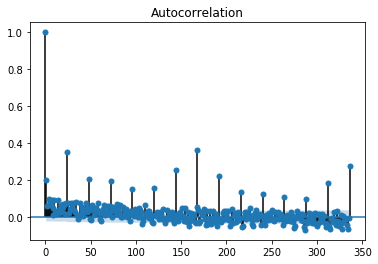

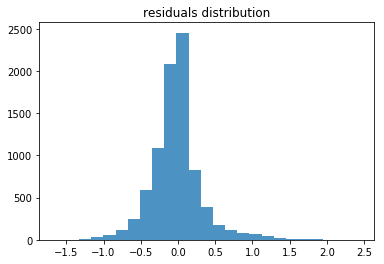

CPU times: user 11min 46s, sys: 3.09 s, total: 11min 49s
Wall time: 11min 53s


In [13]:
%%time
test_model(RandomForestRegressor(random_state=42))

Train on 89045 samples, validate on 9894 samples
Epoch 1/5
89045/89045 [==============================] - 5s - loss: 0.7481 - val_loss: 1.3913
Epoch 2/5
89045/89045 [==============================] - 5s - loss: 0.7249 - val_loss: 1.3912
Epoch 3/5
89045/89045 [==============================] - 5s - loss: 0.7234 - val_loss: 1.3946
Epoch 4/5
89045/89045 [==============================] - 6s - loss: 0.7218 - val_loss: 1.3852
Epoch 5/5
89045/89045 [==============================] - 5s - loss: 0.7225 - val_loss: 1.3803
----------------------------------
<__main__.NN object at 0x11cc55a20> validation summary
-----------------------------------
RMSE = 0.32025500824970116
residuals sum = -198.75372509495656


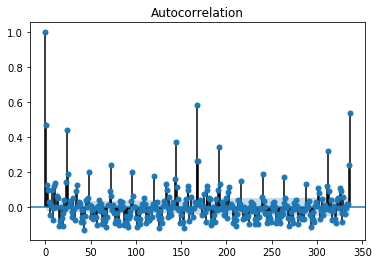

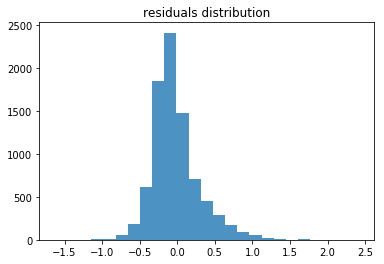

CPU times: user 1min 6s, sys: 10.4 s, total: 1min 16s
Wall time: 30 s


In [14]:
%%time
def base_model():
    model = Sequential()
    model.add(Dense(300, input_dim=lags_count, init='normal'))
    model.add(Dense(1, init='normal'))
    optimizer = SGD(lr=0.01)
    model.compile(loss='mean_squared_error', optimizer = optimizer)
    return model

class PredictionHistory(Callback):
    def __init__(self):
        self.predhis = []
    
    def on_epoch_end(self, epoch, logs={}):
        self.predhis.append(model.predict(test[["t_%s" % i for i in range(lags_count)]]))

class NN():
    def __init__(self):
        self.model_ = KerasRegressor(build_fn=base_model, nb_epoch=5, batch_size=100, validation_split=0.1)
    
    def fit(self, X, y):
        self.predict_hist_ = PredictionHistory()
        self.model_.fit(X.as_matrix(), y.values, callbacks=[])
        return self
    
    def predict(self, X):
        return self.model_.predict(X.as_matrix())

model = NN()
    
test_model(model)

In [15]:
num = 1
for pred in model.predict_hist_.predhis[:60]:
    real = test.label
    pred = pred * test['std'] + test['mean']
    pred = list(map(lambda x: 0 if x < 0 else x, pred))
    real = real * test['std'] + test['mean']
    init_notebook_mode(connected=True)
    layout = plotly.graph_objs.Layout(title=str(num))
    size = 300
    trace1 = go.Scatter(
        x=dates[-size:],
        y=real.values[-size:],
        name = "real")
    trace2 = go.Scatter(
        x=dates[-size:],
        y=pred[-size:],
        name="pred")

    d = [trace1, trace2]

    fig = go.Figure(data=d, layout=layout)
    
    iplot(fig, show_link=False)
    num += 1

Train on 89045 samples, validate on 9894 samples
Epoch 1/20
89045/89045 [==============================] - 20s - loss: 0.9144 - val_loss: 1.5118
Epoch 2/20
89045/89045 [==============================] - 20s - loss: 0.7530 - val_loss: 1.4258
Epoch 3/20
89045/89045 [==============================] - 24s - loss: 0.7183 - val_loss: 1.3902
Epoch 4/20
89045/89045 [==============================] - 21s - loss: 0.7011 - val_loss: 1.3672
Epoch 5/20
89045/89045 [==============================] - 19s - loss: 0.6900 - val_loss: 1.3530
Epoch 6/20
89045/89045 [==============================] - 19s - loss: 0.6817 - val_loss: 1.3443
Epoch 7/20
89045/89045 [==============================] - 23s - loss: 0.6752 - val_loss: 1.3401
Epoch 8/20
89045/89045 [==============================] - 22s - loss: 0.6696 - val_loss: 1.3345
Epoch 9/20
89045/89045 [==============================] - 21s - loss: 0.6648 - val_loss: 1.3294
Epoch 10/20
89045/89045 [==============================] - 23s - loss: 0.6603 - val_los

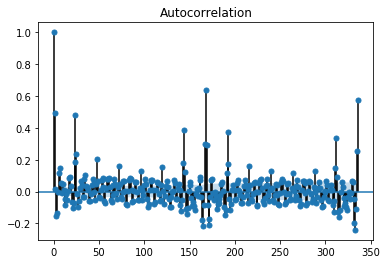

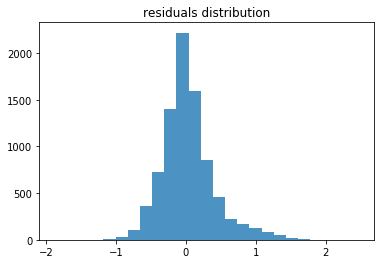

CPU times: user 20min 39s, sys: 5min 23s, total: 26min 3s
Wall time: 7min 28s


In [16]:
%%time
def base_model_lstm():
    model = Sequential()
    model.add(LSTM(input_shape = (lags_count,), input_dim=lags_count, output_dim=168, return_sequences=False))
    model.add(Dense(100, init='normal'))
    model.add(Dense(1, init='normal'))
    optimizer = SGD(lr=0.005)
    model.compile(loss='mean_squared_error', optimizer = optimizer)
    return model
    
class LSTM_NN():
    def __init__(self):
        self.model_ = KerasRegressor(build_fn=base_model_lstm, nb_epoch=20, batch_size=100, validation_split=0.1)
    
    def fit(self, X, y):
        x_fit = np.reshape(X.as_matrix(), (X.shape[0], 1, X.shape[1]))
        self.model_.fit(x_fit, y.values)
        return self
    
    def predict(self, X):
        X = np.reshape(X.as_matrix(), (X.shape[0], 1, X.shape[1]))
        return self.model_.predict(X)
    
test_model(LSTM_NN())

----------------------------------
Unnamed method validation summary
-----------------------------------
RMSE = 198.70040499561355
residuals sum = -108734.59561708652


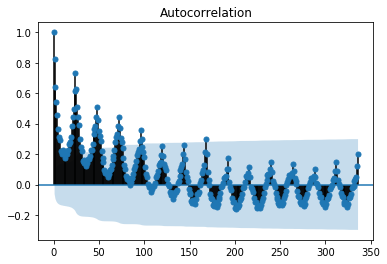

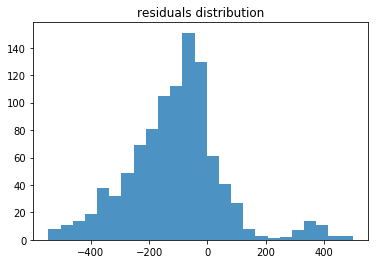

CPU times: user 10 s, sys: 999 ms, total: 11 s
Wall time: 6.95 s


In [17]:
%%time
model = linear_model.LinearRegression()
size = 1000
model.fit(train[["t_%s" % i for i in range(lags_count)]], train.label)
train_multistep = test[:-size]
test_multistep = test[-size:].label * test[-size:]['std'] + test[-size:]['mean']
x_multi = train_multistep.iloc[-1]
std = x_multi['std']
mean = x_multi['mean']
x_multi = x_multi[["t_%s" % i for i in range(lags_count)]]
pred = []
for i in range(size):
    pr = model.predict(x_multi)
    pr = pr * std + mean
    pred.append(pr)
    x_multi = x_multi * std + mean
    x_multi = np.concatenate([x_multi[1:], pr])
    scaler = StandardScaler()
    x_multi = scaler.fit_transform(x_multi)
    std = scaler.std_
    mean = scaler.mean_
    
pred = list(map(lambda x: x[0], pred))
validate(pred=pred, real = test_multistep.values, max_lags=lags_count)

trace1 = go.Scatter(
        x=dates[-size:],
        y=test_multistep.values,
        name = "real")
trace2 = go.Scatter(
        x=dates[-size:],
        y=pred,
    name="pred")

d = [trace1, trace2]

fig = go.Figure(data=d)
iplot(fig, show_link=False)

(98939, 336)
Train on 89045 samples, validate on 9894 samples
Epoch 1/20
89045/89045 [==============================] - 4s - loss: 0.7769 - val_loss: 1.3789
Epoch 2/20
89045/89045 [==============================] - 4s - loss: 0.7078 - val_loss: 1.3666
Epoch 3/20
89045/89045 [==============================] - 4s - loss: 0.7046 - val_loss: 1.3667
Epoch 4/20
89045/89045 [==============================] - 4s - loss: 0.7041 - val_loss: 1.3622
Epoch 5/20
89045/89045 [==============================] - 4s - loss: 0.7044 - val_loss: 1.3651
Epoch 6/20
89045/89045 [==============================] - 4s - loss: 0.7044 - val_loss: 1.3574
Epoch 7/20
89045/89045 [==============================] - 4s - loss: 0.7043 - val_loss: 1.3676
Epoch 8/20
89045/89045 [==============================] - 4s - loss: 0.7038 - val_loss: 1.3604
Epoch 9/20
89045/89045 [==============================] - 4s - loss: 0.7042 - val_loss: 1.3619
Epoch 10/20
89045/89045 [==============================] - 4s - loss: 0.7039 - val_

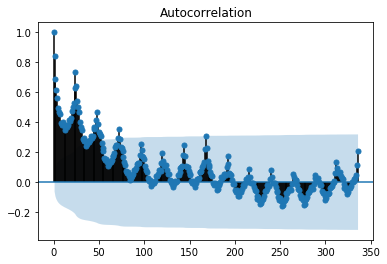

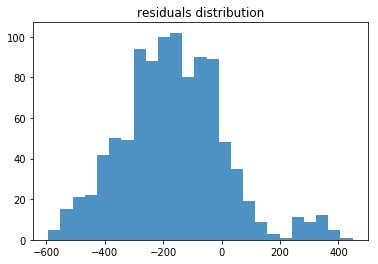

CPU times: user 3min 15s, sys: 40.9 s, total: 3min 56s
Wall time: 1min 31s


In [35]:
%%time
size = 1000

def base_model():
    model = Sequential()
    model.add(Dense(300, input_dim=lags_count, init='normal'))
    model.add(Dense(1, init='normal'))
    optimizer = SGD(lr=0.001)
    model.compile(loss='mean_squared_error', optimizer = optimizer)
    return model

class NN():
    def __init__(self):
        self.model_ = KerasRegressor(build_fn=base_model, nb_epoch=20, batch_size=50, validation_split=0.1)
    
    def fit(self, X, y):
        print(X.shape)
        self.predict_hist_ = PredictionHistory()
        self.model_.fit(X, y)
        return self
    
    def predict(self, X):
        return self.model_.predict(X)

model = NN()
model.fit(train[["t_%s" % i for i in range(lags_count)]].as_matrix(), train.label)
train_multistep = test[:-size]
test_multistep = test[-size:].label * test[-size:]['std'] + test[-size:]['mean']
x_multi = train_multistep.iloc[-1]
std = x_multi['std']
mean = x_multi['mean']
x_multi = x_multi[["t_%s" % i for i in range(lags_count)]].as_matrix()
pred = []
for i in range(size):
    pr = model.predict(x_multi.reshape([1,lags_count]))
    pr = [pr * std + mean]
    pred.append(pr)
    x_multi = x_multi * std + mean
    x_multi = np.concatenate([x_multi[1:], pr])
    scaler = StandardScaler()
    x_multi = scaler.fit_transform(x_multi)
    std = scaler.std_
    mean = scaler.mean_
    
pred = list(map(lambda x: x[0], pred))
validate(pred=pred, real = test_multistep.values, max_lags=lags_count)

trace1 = go.Scatter(
        x=dates[-size:],
        y=test_multistep.values,
        name = "real")
trace2 = go.Scatter(
        x=dates[-size:],
        y=pred,
    name="pred")

d = [trace1, trace2]

fig = go.Figure(data=d)
iplot(fig, show_link=False)

In [36]:
train.label

0       4.204707
1      -0.210235
2      -0.210235
3      -0.210235
4      -0.210235
5      -0.210235
6       4.204707
7      -0.217752
8      -0.217752
9      -0.217752
10     -0.217752
11     -0.217752
12     -0.217752
13      4.086051
14     -0.225070
15     -0.225070
16     -0.225070
17      3.976243
18      3.874217
19     -0.239182
20     -0.239182
21     -0.239182
22     -0.239182
23     -0.239182
24     -0.239182
25     -0.239182
26     -0.239182
27     -0.239182
28      7.797347
29     -0.242183
          ...   
1876   -0.103651
1877   -0.103651
1878   -0.103651
1879   -0.103651
1880   -0.103651
1881   -0.103651
1882   -0.103651
1883   -0.103651
1884   -0.103651
1885   -0.103651
1886   -0.103651
1887   -0.103651
1888   -0.103651
1889   -0.103651
1890   -0.103651
1891   -0.103651
1892   -0.103651
1893   -0.103651
1894   -0.103651
1895   -0.103651
1896   -0.103651
1897   -0.103651
1898   -0.103651
1899   -0.103651
1900   -0.103651
1901   -0.103651
1902   -0.103651
1903    6.8616

In [37]:
def create_multi_features(data, lags_count, forward):
    df = []
    for i in range(lags_count, len(data) - forward):
        part = data[i-lags_count:i]
        scaler = StandardScaler()
        scaled = scaler.fit_transform(part.values)
        label = scaler.transform([data.values[i:i+forward]])[0]
        scaled = np.concatenate([scaled, label, [scaler.std_, scaler.mean_]])
        df.append(scaled)
    df = pd.DataFrame(df)
    df.columns = ["t_%s" % i for i in range(lags_count)] + ["label_%s" % i for i in range(forward)] +  ["std", "mean"]
    return df

In [38]:
forward = lags_count
train_multi = pd.concat([create_multi_features(load_zone(f), lags_count, forward) for f in train_files.name.values])
test_multi = pd.concat([create_multi_features(load_zone(f), lags_count, forward) for f in test_files.name.values])

In [39]:
%%time

size = forward

def base_model():
    model = Sequential()
    model.add(Dense(300, input_dim=lags_count, init='normal'))
    model.add(Dense(lags_count, init='normal'))
    optimizer = SGD(lr=0.001)
    model.compile(loss='mean_squared_error', optimizer = optimizer)
    return model

class NN():
    def __init__(self):
        self.model_ = KerasRegressor(build_fn=base_model, nb_epoch=20, batch_size=50, validation_split=0.1)
    
    def fit(self, X, y):
        self.predict_hist_ = PredictionHistory()
        self.model_.fit(X, y.values)
        return self
    
    def predict(self, X):
        return self.model_.predict(X)

model = NN()
model.fit(train_multi[["t_%s" % i for i in range(lags_count)]].as_matrix(), train_multi[["label_%s" % i for i in range(forward)]])
train_multistep = test_multi[:-size]
test_multistep = test_multi[-size:][["label_%s" % i for i in range(forward)]] * test_multi[-size:]['std'] + test_multi[-size:]['mean']

pred = model.predict(train_multistep[["t_%s" % i for i in range(lags_count)]].as_matrix())
    
pred = np.array(list(map(lambda x: x[0], pred)))

real = train_multistep.iloc[-1][["label_%s" % i for i in range(lags_count)]].values

real = real * train_multistep.iloc[-1]['std'] + train_multistep.iloc[-1]['mean']
pred = pred * train_multistep.iloc[-1]['std'] + train_multistep.iloc[-1]['mean']

pred = np.array(list(map(lambda x: 0 if x < 0 else x, pred)))

trace1 = go.Scatter(
        x=dates[-size:],
        y=real,
        name = "real")
trace2 = go.Scatter(
        x=dates[-size:],
        y=pred,
        name="pred")

d = [trace1, trace2]

fig = go.Figure(data=d)
iplot(fig, show_link=False)

Train on 84509 samples, validate on 9390 samples
Epoch 1/20
84509/84509 [==============================] - 11s - loss: 26.7854 - val_loss: 296.4714
Epoch 2/20
84509/84509 [==============================] - 12s - loss: 26.4986 - val_loss: 296.0772
Epoch 3/20
84509/84509 [==============================] - 9s - loss: 26.3430 - val_loss: 295.7308
Epoch 4/20
84509/84509 [==============================] - 9s - loss: 26.2343 - val_loss: 295.3926
Epoch 5/20
84509/84509 [==============================] - 9s - loss: 26.1477 - val_loss: 295.0441
Epoch 6/20
84509/84509 [==============================] - 15s - loss: 26.0727 - val_loss: 294.6950
Epoch 7/20
84509/84509 [==============================] - 11s - loss: 26.0071 - val_loss: 294.3517
Epoch 8/20
84509/84509 [==============================] - 12s - loss: 25.9498 - val_loss: 294.0311
Epoch 9/20
84509/84509 [==============================] - 10s - loss: 25.9005 - val_loss: 293.7382
Epoch 10/20
84509/84509 [==============================] - 11s 

CPU times: user 9min 58s, sys: 1min 21s, total: 11min 20s
Wall time: 4min


Критерий Дики-Фуллера: p=0.000000


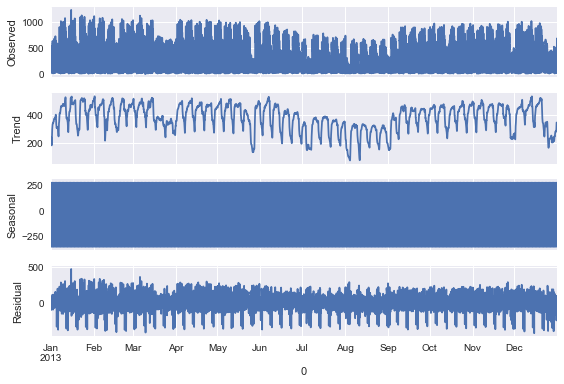

In [76]:
data = load_zone(test_files.name.iloc[-1])
data.index = pd.to_datetime(data.index)
df = pd.DataFrame()
df['y'] = data
sm.tsa.seasonal_decompose(df.y).plot()
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(df.y)[1])

In [41]:
ps = range(0, 3)
d=1
qs = range(0, 1)
Ps = range(0, 3)
D=1
Qs = range(0, 3)
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

27

In [42]:
%%time
results = []
best_aic = float("inf")

for param in tqdm(parameters_list):
    try:
        model=sm.tsa.statespace.SARIMAX(df.y.values, order=(param[0], d, param[1]), 
                                        seasonal_order=(param[2], D, param[3], 24)).fit(disp=-1)
    except ValueError:
        print('wrong parameters:', param)
        continue
    aic = model.aic
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic])
    
warnings.filterwarnings('default')

wrong parameters: (0, 0, 0, 0)
wrong parameters: (0, 0, 1, 2)
wrong parameters: (0, 0, 2, 2)
wrong parameters: (1, 0, 1, 2)
wrong parameters: (1, 0, 2, 2)
wrong parameters: (2, 0, 1, 2)
wrong parameters: (2, 0, 2, 2)
CPU times: user 1h 18min 36s, sys: 4min 7s, total: 1h 22min 43s
Wall time: 47min 8s


In [79]:
best_model.filter_results

TypeError: 'SmootherResults' object is not subscriptable

In [50]:
test.label.autocorr()

0.89040351345706314

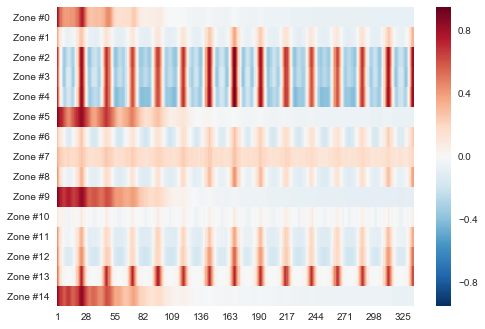

In [69]:
def corrs(file):
    return [load_zone(file).autocorr(i) for i in range(1, 168 * 2)]
hmap = [corrs(f) for f in train_files.name]
hmatrix = np.matrix(hmap)

xticks = np.arange(1, 168 * 2)
keptticks = xticks[::int(len(xticks)/12)]
xticks = ['' for y in xticks]
xticks[::int(len(xticks)/12)] = keptticks

yticks = ["Zone #{}".format(c) for c in range(len(train_files))]

sns.heatmap(hmatrix, yticklabels=yticks, xticklabels=xticks)

In [73]:
x = np.arange(1, 1000)
data = load_zone(test_files.name.iloc[-1])
y = [data.autocorr(i) for i in x]

trace = go.Scatter(x=x, y=y)

d = [trace]
layout = {'title': 'Autocorr'}

# cоздаем объект Figure и визуализируем его
fig = go.Figure(data=d, layout=layout)
iplot(fig, show_link=False)